## Notebook Overview: Temperature Stratification Analysis of CTD Casts

This notebook analyzes vertical temperature stratification in Stagecoach Reservoir using CTD cast data collected across multiple dates and locations.

### What the Code Does:
- Loads cleaned CTD profiles containing temperature and depth.
- Identifies and extracts top and bottom water temperatures from each cast.
- Computes vertical temperature gradients as a measure of thermal stratification.
- Applies smoothing (e.g. Savitzky-Golay filter) to reduce noise in temperature profiles.
- Visualizes stratification strength across casts and dates to detect trends in mixing conditions.

This analysis helps quantify day-to-day changes in thermal layering, which is essential for interpreting MLD variability.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy.signal import savgol_filter

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Group the DataFrame by 'File name'
fn = [
 'CC2435009_20250517_180836','CC2435009_20250517_180756', 'CC2435009_20250517_180717', 'CC2435009_20250517_180530', 'CC2435009_20250517_180453', 'CC2435009_20250517_180414', 'CC2435009_20250517_180205',
 'CC2435009_20250517_180034','CC2435009_20250517_175943', 'CC2435009_20250517_175849', 'CC2435009_20250517_175733', 'CC2435009_20250516_180646',
 'CC2435009_20250516_180530', 'CC2435009_20250516_180406', 'CC2435009_20250516_180256', 'CC2435009_20250516_180000','CC2435009_20250516_175824', 'CC2435009_20250516_175707', 'CC2435009_20250516_175439',
 'CC2435009_20250516_175230', 'CC2435009_20250516_175050', 'CC2435009_20250515_213650','CC2435009_20250515_213542', 'CC2435009_20250515_213434', 'CC2435009_20250515_200555',
 'CC2435009_20250515_200231', 'CC2435009_20250515_192831', 'CC2435009_20250515_180950', 'CC2435009_20250515_175944', 'CC2435009_20250515_175623', 'CC2435009_20250515_175044',
 'CC2435009_20250514_195848', 'CC2435009_20250514_195811', 'CC2435009_20250514_195603', 'CC2435009_20250514_195430', 'CC2435009_20250514_195326', 'CC2435009_20250514_195240',
 'CC2435009_20250513_195436', 'CC2435009_20250513_195323', 'CC2435009_20250513_195019', 'CC2435009_20250513_194839', 'CC2435009_20250513_194520', 'CC2435009_20250513_194404']
reels = {name: group for name, group in df.groupby('File name')}

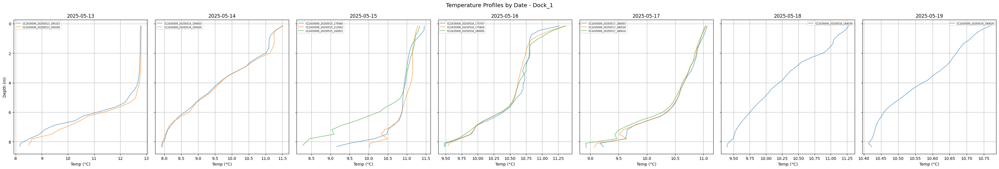

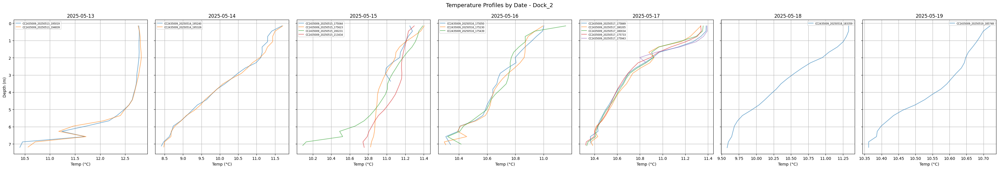

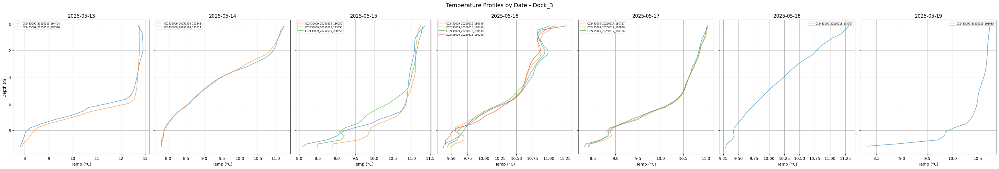

In [ ]:
# Reload the dataset
df = pd.read_csv("/content/drive/MyDrive/MLD/Final_Dock_Cast_Data.csv")

# Convert cast time column to datetime
df['Cast time (local)'] = pd.to_datetime(df['Cast time (local)'])

# Extract just the date part for grouping
df['Cast Date'] = df['Cast time (local)'].dt.date

# Group by Dock Location and Date
dock_groups = df.groupby('Dock Location')

# Plot temperature profiles grouped by dock, with subplots for each day
for dock, dock_df in dock_groups:
    unique_dates = dock_df['Cast Date'].unique()
    n_dates = len(unique_dates)

    fig, axs = plt.subplots(nrows=1, ncols=n_dates, figsize=(5 * n_dates, 6), sharey=True)
    if n_dates == 1:
        axs = [axs]  # Ensure it's iterable

    for i, cast_date in enumerate(unique_dates):
        ax = axs[i]
        date_df = dock_df[dock_df['Cast Date'] == cast_date]
        for fname in date_df['File name'].unique():
            cast = date_df[date_df['File name'] == fname]
            ax.plot(cast['Temperature (Celsius)'], cast['Depth (Meter)'], label=fname, alpha=0.6)

        ax.invert_yaxis()
        ax.set_title(f'{cast_date}')
        ax.set_xlabel('Temp (°C)')
        ax.grid(True)
        if i == 0:
            ax.set_ylabel('Depth (m)')
        ax.legend(fontsize=6)

    plt.suptitle(f'Temperature Profiles by Date - {dock}', fontsize=14)
    plt.tight_layout()
    plt.show()


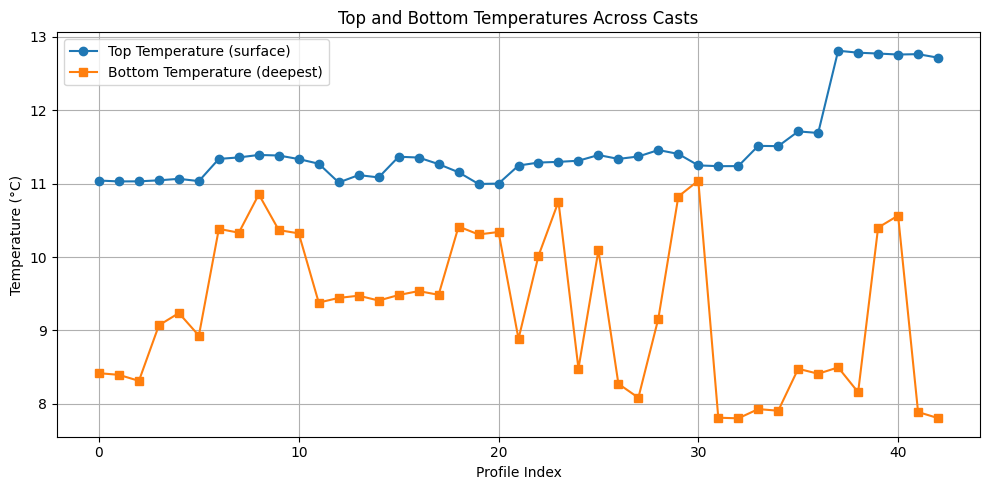

In [ ]:
top_temps = []
bottom_temps = []
cast_ids = []

for name in fn:
    df = reels[name]
    if 'Temperature (Celsius)' in df.columns and 'Depth (Meter)' in df.columns:
        temps = df['Temperature (Celsius)'].to_numpy()
        depths = df['Depth (Meter)'].to_numpy()
        if len(temps) < 2:
            continue  # skip bad or empty casts

        # Find top and bottom temperatures using shallowest and deepest depths
        top_idx = np.argmin(depths)
        bottom_idx = np.argmax(depths)

        top_temps.append(temps[top_idx])
        bottom_temps.append(temps[bottom_idx])
        cast_ids.append(name)

# --- Plotting ---
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(top_temps, label='Top Temperature (surface)', marker='o')
plt.plot(bottom_temps, label='Bottom Temperature (deepest)', marker='s')
plt.xlabel('Profile Index')
plt.ylabel('Temperature (°C)')
plt.title('Top and Bottom Temperatures Across Casts')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


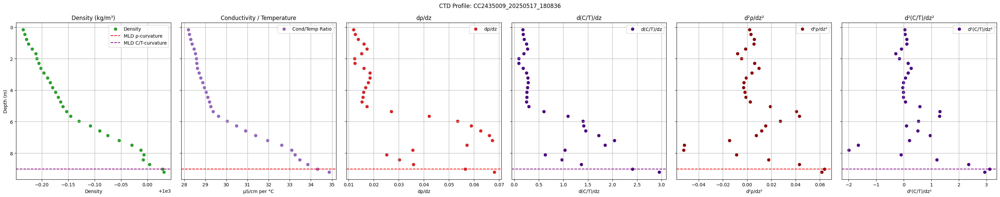

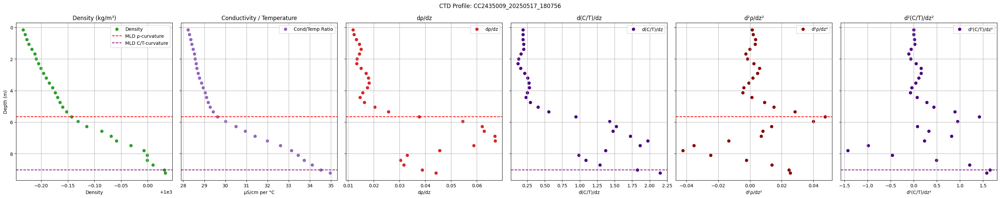

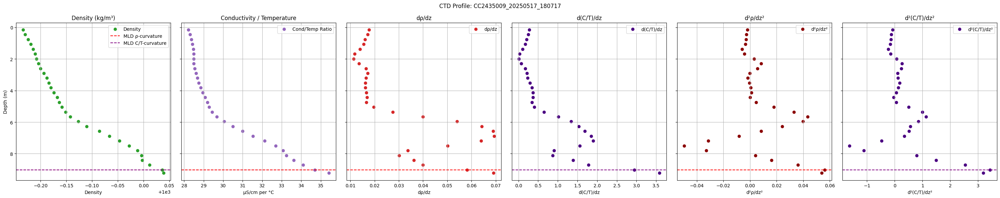

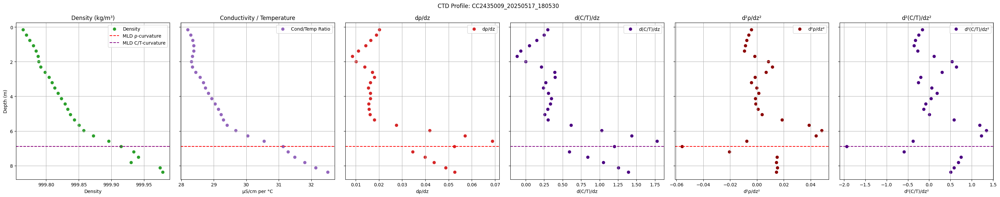

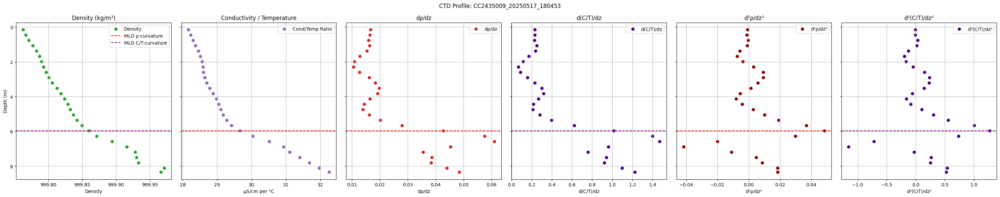

...

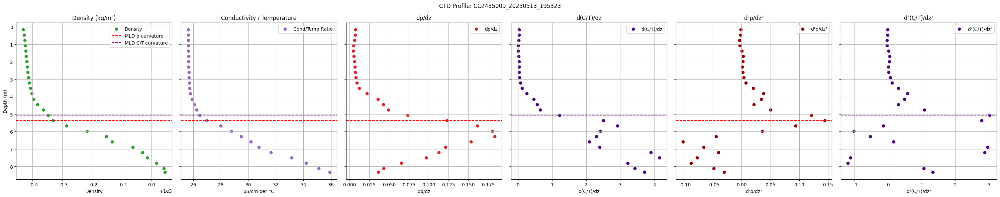

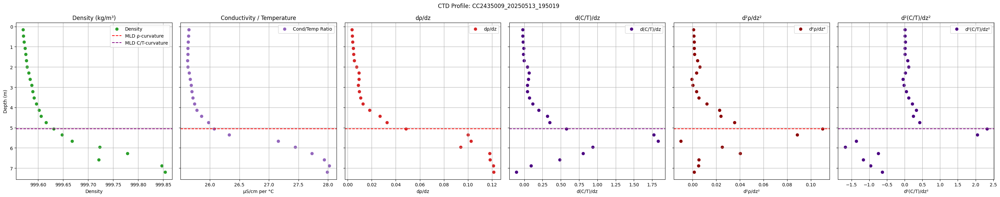

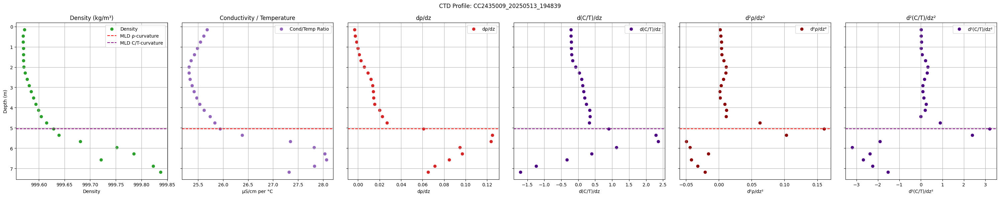

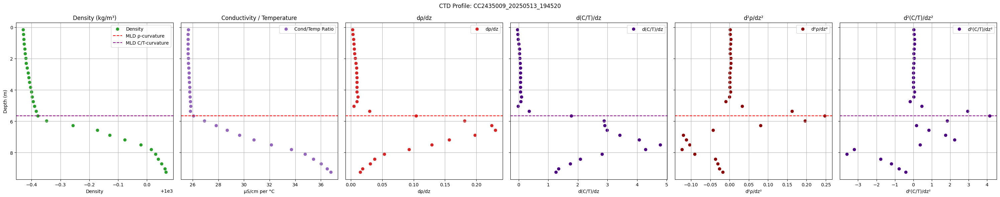

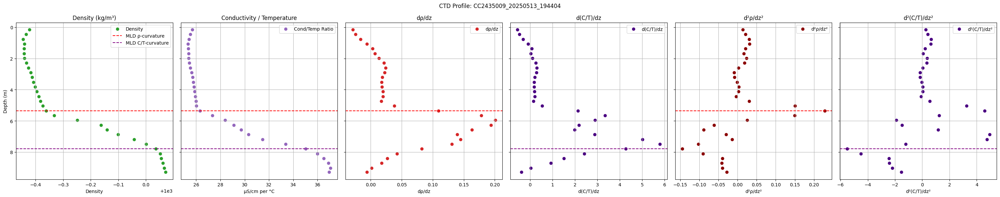

In [ ]:
for i, name in enumerate(fn):
    df = reels[name]
    temps = df['Temperature (Celsius)'].to_numpy()
    depths = df['Depth (Meter)'].to_numpy()
    conds = df['Conductivity (MicroSiemens per Centimeter)'].to_numpy()
    dens = df['Density (Kilograms per Cubic Meter)'].to_numpy()

    if len(temps) < 7: # QC Check, small datasets are error casts
        continue

    # --- Safe smoothing ---
    window_len = min(len(temps) if len(temps) % 2 == 1 else len(temps)-1, 7)
    if window_len < 3:
        continue

    smoothed_dens = savgol_filter(dens, window_length=window_len, polyorder=2)

    with np.errstate(divide='ignore', invalid='ignore'):
        cond_temp_ratio = np.where(temps != 0, conds / temps, np.nan)
    smoothed_ratio = savgol_filter(cond_temp_ratio, window_length=window_len, polyorder=2)

    # --- First Derivatives ---
    drhodz = np.gradient(smoothed_dens, depths)
    dratiodz = np.gradient(smoothed_ratio, depths)

    # --- Second Derivatives ---
    d2rhodz2 = np.gradient(drhodz, depths[:len(drhodz)])
    d2ratiodz2 = np.gradient(dratiodz, depths[:len(dratiodz)])

    # --- MLD Picks via max curvature ---
    mld_rho_idx = np.argmax(np.abs(d2rhodz2))
    mld_rho_depth = depths[mld_rho_idx]

    mld_ratio_idx = np.argmax(np.abs(d2ratiodz2))
    mld_ratio_depth = depths[mld_ratio_idx]

    # --- Plotting: 6 Subplots in a Row ---
    fig, axs = plt.subplots(1, 6, figsize=(30, 6), sharey=True)

    ## Plot 1: Density
    axs[0].scatter(dens, depths, color='tab:green', label='Density')
    axs[0].axhline(mld_rho_depth, color='red', linestyle='--', label='MLD ρ-curvature')
    axs[0].axhline(mld_ratio_depth, color='purple', linestyle='--', label='MLD C/T-curvature')
    axs[0].invert_yaxis()
    axs[0].set_title("Density (kg/m³)")
    axs[0].set_xlabel("Density")
    axs[0].set_ylabel("Depth (m)")
    axs[0].legend()
    axs[0].grid(True)

    ## Plot 2: Cond/Temp Ratio
    axs[1].scatter(smoothed_ratio, depths, color='tab:purple', label='Cond/Temp Ratio')
    axs[1].axhline(mld_ratio_depth, color='purple', linestyle='--')
    axs[1].axhline(mld_rho_depth, color='red', linestyle='--')
    axs[1].set_title("Conductivity / Temperature")
    axs[1].set_xlabel("μS/cm per °C")
    axs[1].legend()
    axs[1].grid(True)

    ## Plot 3: First Derivative of Density
    axs[2].scatter(drhodz, depths, color='tab:red', label='dρ/dz')
    axs[2].axhline(mld_rho_depth, color='red', linestyle='--')
    axs[2].set_title("dρ/dz")
    axs[2].set_xlabel("dρ/dz")
    axs[2].legend()
    axs[2].grid(True)

    ## Plot 4: First Derivative of C/T
    axs[3].scatter(dratiodz, depths, color='indigo', label='d(C/T)/dz')
    axs[3].axhline(mld_ratio_depth, color='purple', linestyle='--')
    axs[3].set_title("d(C/T)/dz")
    axs[3].set_xlabel("d(C/T)/dz")
    axs[3].legend()
    axs[3].grid(True)

    ## Plot 5: Second Derivative of Density
    axs[4].scatter(d2rhodz2, depths[:len(d2rhodz2)], color='darkred', label='d²ρ/dz²')
    axs[4].axhline(mld_rho_depth, color='red', linestyle='--')
    axs[4].set_title("d²ρ/dz²")
    axs[4].set_xlabel("d²ρ/dz²")
    axs[4].legend()
    axs[4].grid(True)

    ## Plot 6: Second Derivative of C/T
    axs[5].scatter(d2ratiodz2, depths[:len(d2ratiodz2)], color='indigo', label='d²(C/T)/dz²')
    axs[5].axhline(mld_ratio_depth, color='purple', linestyle='--')
    axs[5].set_title("d²(C/T)/dz²")
    axs[5].set_xlabel("d²(C/T)/dz²")
    axs[5].legend()
    axs[5].grid(True)

    plt.suptitle(f'CTD Profile: {name}')
    plt.tight_layout()
    plt.show()


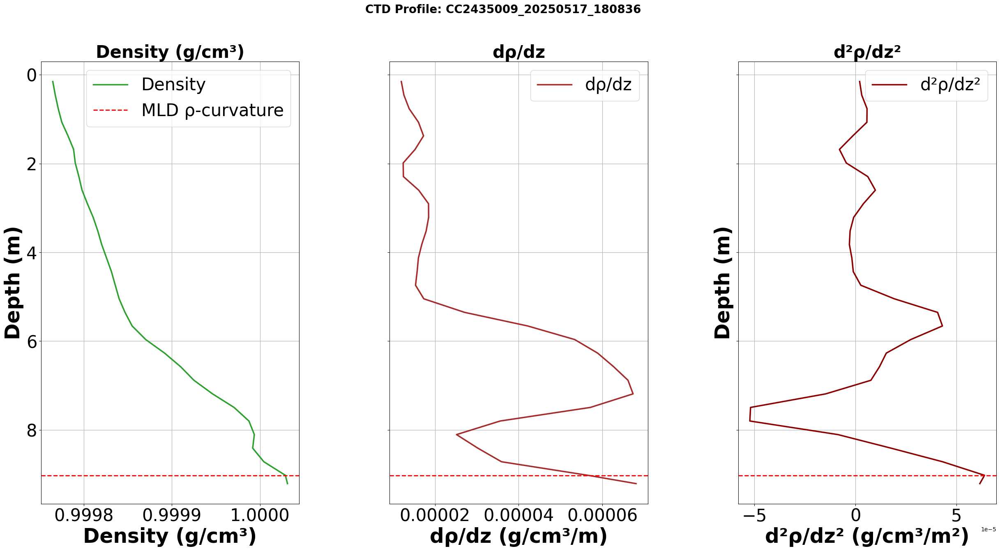

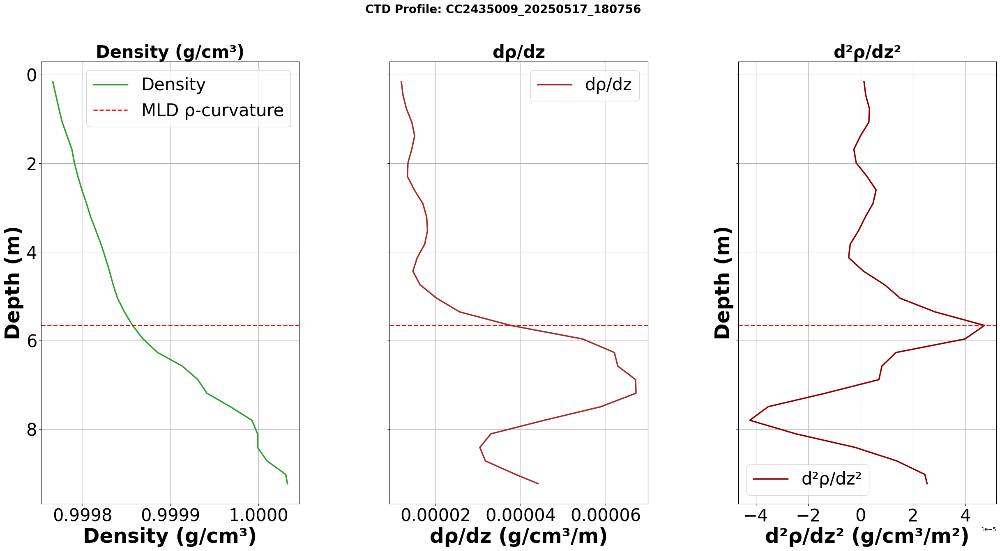

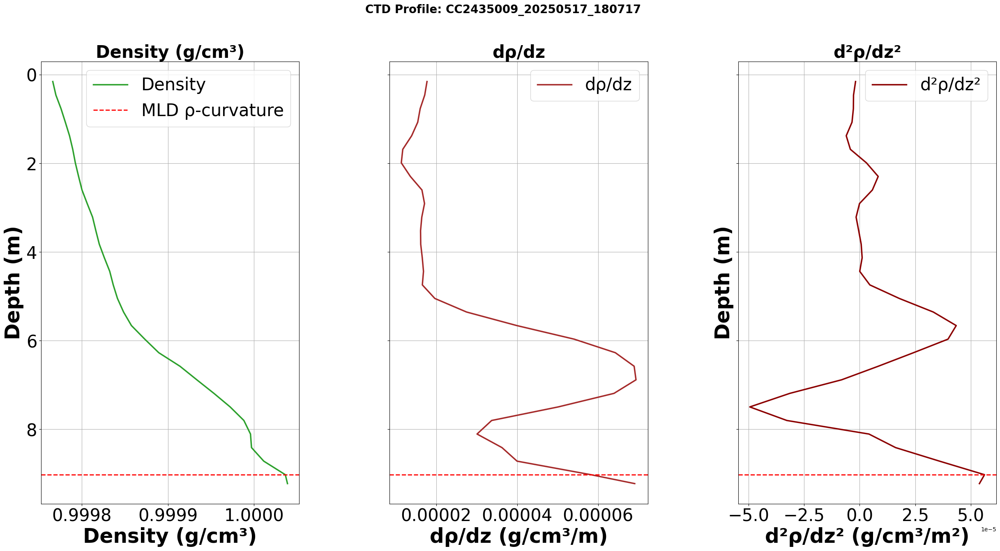

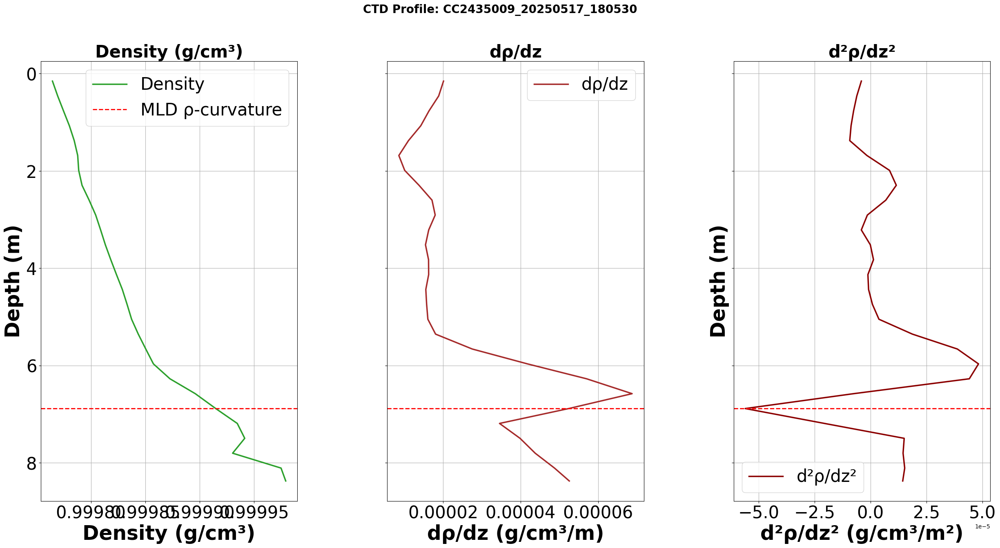

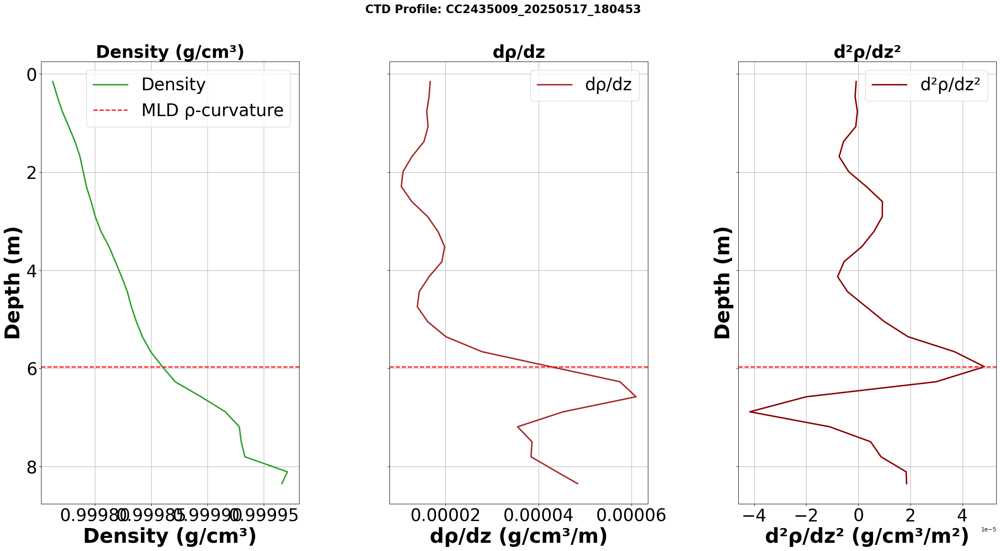

...

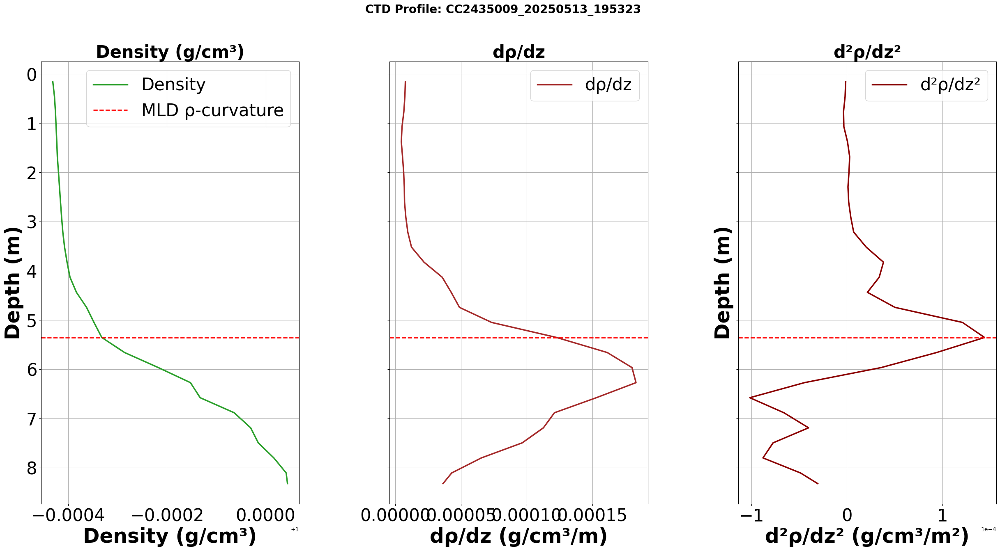

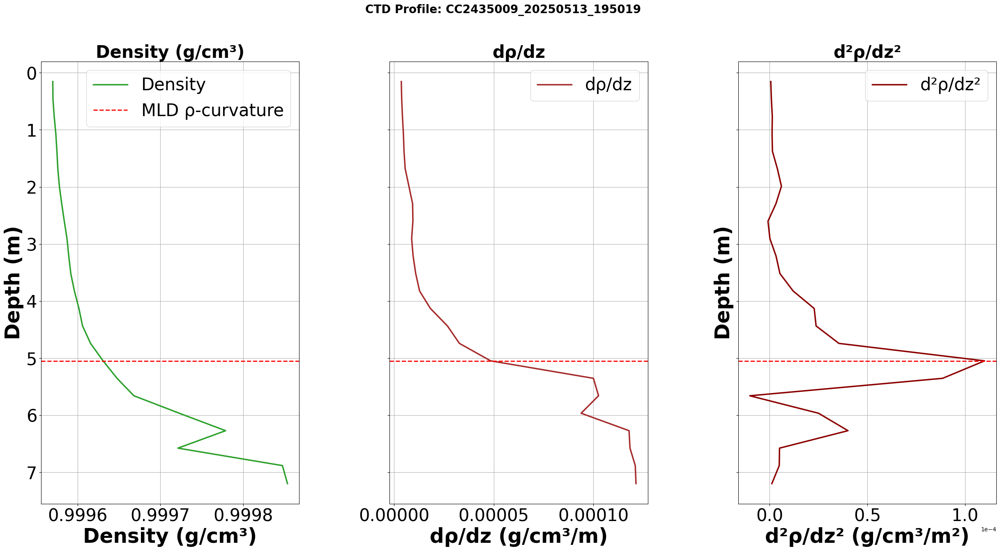

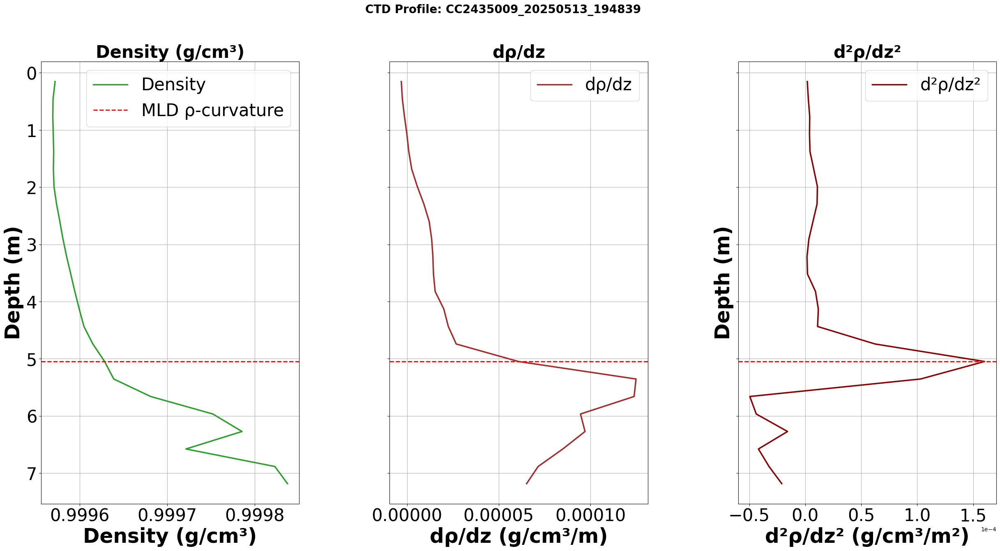

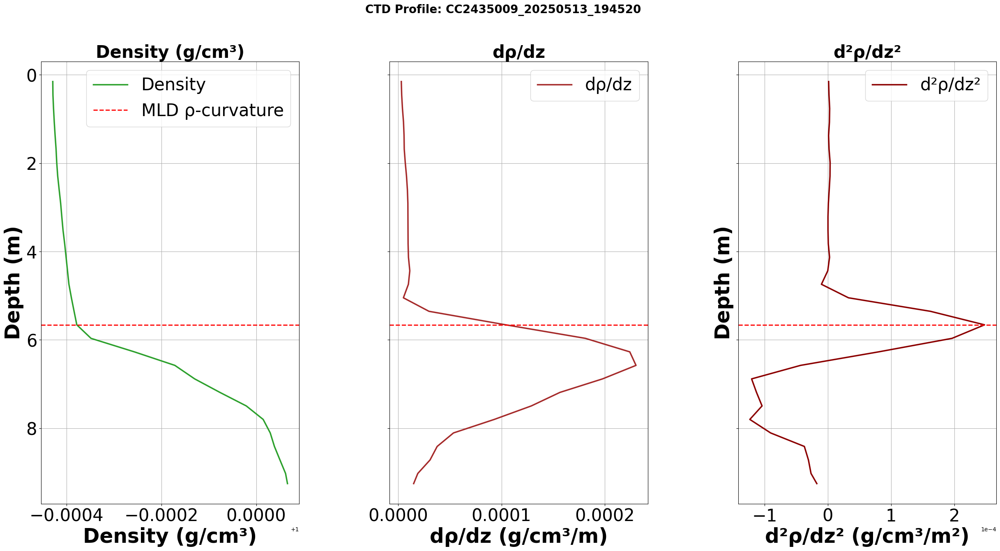

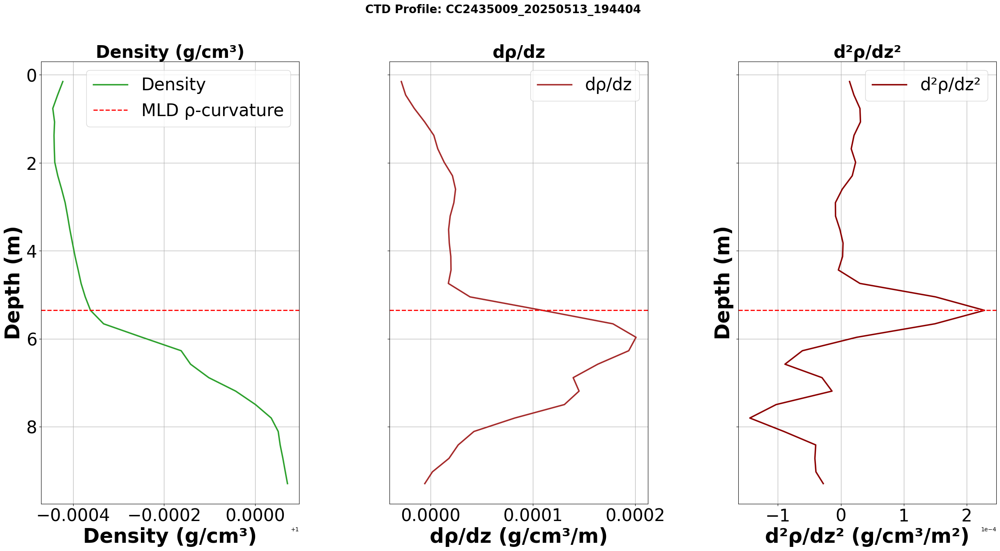

In [ ]:

for i, name in enumerate(fn):
    df = reels[name]
    temps = df['Temperature (Celsius)'].to_numpy()
    depths = df['Depth (Meter)'].to_numpy()
    dens = df['Density (Kilograms per Cubic Meter)'].to_numpy()

    if len(temps) < 7:
        continue

    window_len = min(len(temps) if len(temps) % 2 == 1 else len(temps)-1, 7)
    if window_len < 3:
        continue

    dens_gcm3 = dens / 1000.0
    smoothed_dens = savgol_filter(dens_gcm3, window_length=window_len, polyorder=2)

    drhodz = np.gradient(smoothed_dens, depths)
    d2rhodz2 = np.gradient(drhodz, depths[:len(drhodz)])

    mld_rho_idx = np.argmax(np.abs(d2rhodz2))
    mld_rho_depth = depths[mld_rho_idx]

    fig, axs = plt.subplots(1, 3, figsize=(30, 14), sharey=True)
    fig.subplots_adjust(wspace=0.35)

    ## Plot 1: Density
    axs[0].plot(dens_gcm3, depths, color='tab:green', label='Density', lw=2.5)
    axs[0].axhline(mld_rho_depth, color='red', linestyle='--', label='MLD ρ-curvature', lw=2)
    axs[0].invert_yaxis()
    axs[0].set_title("Density (g/cm³)", fontsize=30, fontweight='bold')
    axs[0].set_xlabel("Density (g/cm³)", fontsize=35, fontweight='bold')
    axs[0].set_ylabel("Depth (m)", fontsize=35, fontweight='bold')
    axs[0].tick_params(labelsize=30)
    axs[0].ticklabel_format(style='plain', axis='x')
    axs[0].legend(fontsize=30)
    axs[0].grid(True)

    ## Plot 2: First Derivative
    axs[1].plot(drhodz, depths[:len(drhodz)], color='brown', label='dρ/dz', lw=2.5)
    axs[1].axhline(mld_rho_depth, color='red', linestyle='--', lw=2)
    axs[1].set_title("dρ/dz", fontsize=30, fontweight='bold')
    axs[1].set_xlabel("dρ/dz (g/cm³/m)", fontsize=35, fontweight='bold')
    axs[1].tick_params(labelsize=30)
    axs[1].ticklabel_format(style='plain', axis='x')
    axs[1].legend(fontsize=30)
    axs[1].grid(True)

    ## Plot 3: Second Derivative (uses scientific notation)
    axs[2].plot(d2rhodz2, depths[:len(d2rhodz2)], color='darkred', label='d²ρ/dz²', lw=2.5)
    axs[2].axhline(mld_rho_depth, color='red', linestyle='--', lw=2)
    axs[2].set_title("d²ρ/dz²", fontsize=30, fontweight='bold')
    axs[2].set_xlabel("d²ρ/dz² (g/cm³/m²)", fontsize=35, fontweight='bold')
    axs[2].set_ylabel("Depth (m)", fontsize=35, fontweight='bold')
    axs[2].tick_params(labelsize=30)
    axs[2].ticklabel_format(style='sci', axis='x', scilimits=(-2, 2))  # <- scientific notation
    axs[2].legend(fontsize=30)
    axs[2].grid(True)

    plt.suptitle(f'CTD Profile: {name}', fontsize=20, fontweight='bold')
    plt.show()
